# WA-only NRM Region Analysis 

**Climate dashboard for Western Australia's 7 NRM regions**

This notebook transforms raw NARCliM 2.0 temperature data (`tasmax`) into **stakeholder-ready regional summaries**:

| Output | Purpose |
|--------|---------|
| 📈 **Time series plot** | Monthly temperature trends per region |
| 📊 **Summary table** | Annual mean temperature per NRM region |
| 🗺️ **Interactive map** | Choropleth showing hottest/coolest regions |

**This notebook**
- Uses the **official NRM Regions 2023 shapefile**
- Filters to **Western Australia only** using `STATE == "WA"`
- Works on the **native WRF grid** using `rlat/rlon` indices
- Builds a **mask per NRM region** and computes spatial averages over time

- Run all cells → get WA climate dashboard in ~2 minutes
---

<a id="top"></a>
## Notebook structure

- [Prerequisites](#Prerequisites)
- [Imports](#Imports)
- [Load NARCliM Data](#Load-NARCliM-Data)
- [Load NRM Shapefile](#Load-NRM-Shapefile)
- [Build WRF grid points](#Build-WRF-grid-points)
- [Spatial join to regions](#Spatial-join-to-regions)
- [Region Masks and Time Series](#Region-Masks-and-Time-Series)
- [Time Series Plot](#Time-Series-Plot)
- [Summary Table](#Summary-Table)
- [Choropleth Map](#Choropleth-Map)
- [Next Steps](#Next-Steps)

## Prerequisites

### Shapefiles

 Place nrm_shp in the same folder as this notebook (or update the path in the next section).     
**NRM Regions 2023** = Official Australian boundaries for natural resource management planning


<div style="text-align: right">
  <a href="#top">Go back to top</a>
</div>

## Imports
Load libraries for:
- `xarray`: Climate data handling
- `geopandas`: NRM shapefile processing  
- `plotly`: Interactive choropleth map
- `matplotlib`: Time series plot

In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import plotly.express as px
import json
from climate_utils import kelvin_to_celsius


<div style="text-align: right">
  <a href="#top">Go back to top</a>
</div>

## Load NARCliM Data  

In [2]:
url = (
    "https://dapds00.nci.org.au/thredds/dodsC/zz63/"
    "NARCliM2-0/output-CMIP6/DD/AUS-18/NSW-Government/"
    "ACCESS-ESM1-5/ssp126/r6i1p1f1/"
    "NARCliM2-0-WRF412R3/v1-r1/mon/tasmax/latest/"
    "tasmax_AUS-18_ACCESS-ESM1-5_ssp126_r6i1p1f1_"
    "NSW-Government_NARCliM2-0-WRF412R3_v1-r1_"
    "mon_201901-201912.nc"
)

# Variable to analyse (matches your notebook's variable_dd.value usage)
variable = "tasmax"

# Open dataset
ds = xr.open_dataset(url, engine="netcdf4", decode_times=False, cache=False)

<div style="text-align: right">
  <a href="#top">Go back to top</a>
</div>

## Load NRM Shapefile

1. Read official **NRM Regions 2023** shapefile
2. Convert to **EPSG:4326** (lat/lon) for WRF grid matching
3. Filter to **STATE == "WA"** → **7 regions**:
   - Rangelands Region, Northern Agricultural, Avon River Basin
   - Peel-Harvey, Swan, South West, South Coast


In [11]:
nrm = gpd.read_file("nrm_shp")

# Ensure lat/lon CRS (required for WRF grid)
nrm = nrm.to_crs(epsg=4326)

# Keep Western Australia only
# (Your original notebook used: nrm[nrm["STATE"] == "WA"])
if "STATE" in nrm.columns:
    nrm_wa = nrm[nrm["STATE"] == "WA"].copy()
else:
    # Fallback: if STATE column is missing, keep all and warn
    nrm_wa = nrm.copy()
    print("⚠️ 'STATE' column not found in shapefile; using all polygons as-is.")

print("CRS:", nrm_wa.crs)
print("WA NRM regions:", nrm_wa["NRM_REGION"].unique())

CRS: EPSG:4326
WA NRM regions: ['Avon River Basin' 'Northern Agricultural Region' 'Peel-Harvey Region'
 'Swan Region' 'Rangelands Region' 'South Coast Region'
 'South West Region']


<div style="text-align: right">
  <a href="#top">Go back to top</a>
</div>

## Build WRF grid points

- Read 2-D `lat`/`lon` from the dataset
- Create a GeoDataFrame of points with:
  - `rlat`, `rlon` = native grid indices
  - `geometry` = Point(lon, lat)


In [4]:
# Detect lat/lon arrays (your dataset uses ds['lat'], ds['lon'])
if "lat" in ds.variables and "lon" in ds.variables:
    lat = ds["lat"].values
    lon = ds["lon"].values
elif "XLAT" in ds.variables and "XLONG" in ds.variables:
    lat = ds["XLAT"].values
    lon = ds["XLONG"].values
else:
    raise KeyError("Could not find lat/lon arrays in dataset (expected lat/lon or XLAT/XLONG).")

# Build (rlat, rlon) index grids
rlat_idx, rlon_idx = np.indices(lat.shape)

# Vectorised point GeoDataFrame (same outcome as your loop, but faster)
points = gpd.GeoDataFrame(
    {
        "rlat": rlat_idx.ravel(),
        "rlon": rlon_idx.ravel(),
    },
    geometry=gpd.points_from_xy(lon.ravel(), lat.ravel()),
    crs="EPSG:4326",
)

points.head(), points.shape

(   rlat  rlon                    geometry
 0     0     0  POINT (89.14423 -44.24784)
 1     0     1  POINT (89.34929 -44.31666)
 2     0     2  POINT (89.55474 -44.38529)
 3     0     3  POINT (89.76056 -44.45372)
 4     0     4  POINT (89.96674 -44.52196),
 (159537, 3))

<div style="text-align: right">
  <a href="#top">Go back to top</a>
</div>

## Spatial join to regions

Grid → NRM regions
We join points into polygons (`within`).  
Result: a point table where each point knows its `NRM_REGION`.

**Key step**: Assign each WRF grid point to its NRM region using `gpd.sjoin(how="inner", predicate="within")`.

In [5]:
points_nrm = gpd.sjoin(
    points,
    nrm_wa[["NRM_REGION", "geometry"]],
    how="inner",
    predicate="within"
)

points_nrm.head(), len(points_nrm)

(       rlat  rlon                     geometry  index_right  \
 43834    88    98  POINT (116.12067 -34.84599)           38   
 43835    88    99  POINT (116.32855 -34.88305)           38   
 43836    88   100  POINT (116.53658 -34.91981)           38   
 43837    88   101   POINT (116.74481 -34.9563)           38   
 43838    88   102  POINT (116.95316 -34.99249)           37   
 
                NRM_REGION  
 43834   South West Region  
 43835   South West Region  
 43836   South West Region  
 43837   South West Region  
 43838  South Coast Region  ,
 6961)

<div style="text-align: right">
  <a href="#top">Go back to top</a>
</div>

**Result**: Every grid cell now has a region label for regional averaging.


## Region Masks and Time Series 

For each WA NRM region:
- Create a boolean mask on the native grid (rlat/rlon): `True` where grid cells belong to that region
- Compute spatial mean over (`rlat`, `rlon`):  `tasmax.where(mask).mean(dim=["rlat", "rlon"])`
- Store 12-month time series per region

**Output**: 7 time series (monthly regional averages)

In [6]:
ds[variable] = kelvin_to_celsius(ds[variable])
nrm_timeseries = {}

for region in points_nrm["NRM_REGION"].unique():
    subset = points_nrm[points_nrm["NRM_REGION"] == region]

    # Boolean mask on native grid
    mask = np.zeros(lat.shape, dtype=bool)
    mask[subset["rlat"].values, subset["rlon"].values] = True

    ts = (
        ds[variable]
        .where(mask)
        .mean(dim=("rlat", "rlon"))
    )

    nrm_timeseries[region] = ts

list(nrm_timeseries.keys())

['South West Region',
 'South Coast Region',
 'Avon River Basin',
 'Peel-Harvey Region',
 'Swan Region',
 'Rangelands Region',
 'Northern Agricultural Region']

<div style="text-align: right">
  <a href="#top">Go back to top</a>
</div>

## Time Series Plot

**Plot monthly temperature averages** for all 7 WA NRM regions.

**Expected pattern**: Rangelands hottest, coastal regions cooler.

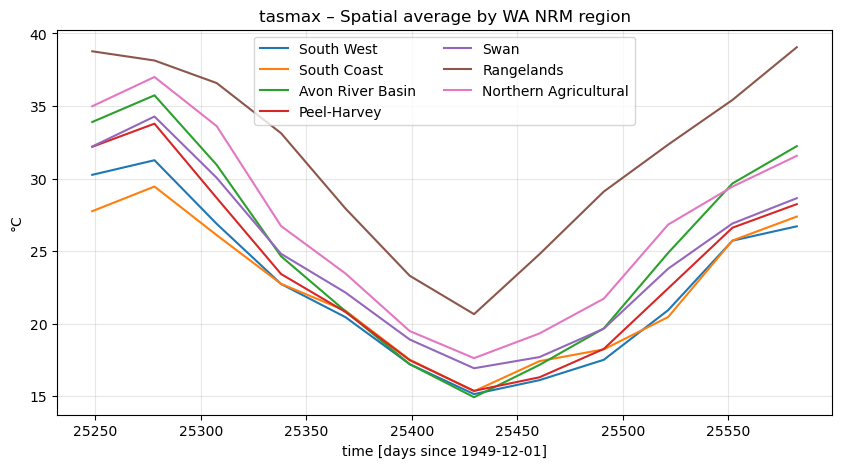

In [7]:
plt.figure(figsize=(10,5))

for region, ts in nrm_timeseries.items():
    label = region.replace(" Region", "").strip()
    ts.plot(label=label)

plt.title(f"{variable} – Spatial average by WA NRM region")
plt.ylabel(ds[variable].attrs.get("units", ""))
plt.legend(ncol=2)
plt.grid(alpha=0.3)
plt.show()


<div style="text-align: right">
  <a href="#top">Go back to top</a>
</div>

## Summary Table

**Compute mean over all 12 months** → single value per NRM region.

**Use case**: Stakeholder reporting, regional comparisons.

In [8]:
summary_df = pd.DataFrame([
    {
        "NRM_REGION": region,
        "Mean_Value": float(ts.mean().values)
    }
    for region, ts in nrm_timeseries.items()
])

summary_df

,NRM_REGION,Mean_Value
0,South West Region,22.575796
1,South Coast Region,22.417694
2,Avon River Basin,25.151205
3,Peel-Harvey Region,23.629377
4,Swan Region,24.667803
5,Rangelands Region,31.599524
6,Northern Agricultural Region,26.814825


<div style="text-align: right">
  <a href="#top">Go back to top</a>
</div>

### Map preparation: merge summary back to WA NRM polygons

Prepare choropleth map data:

Merge summary table back to NRM polygons→ each region polygon gets its mean temperature value.

In [9]:
nrm_map = nrm_wa.merge(
    summary_df,
    on="NRM_REGION",
    how="left"
)

nrm_map.head()

,FID,STATE,NRM_DESC,RDP_DESC,NRM_ID,NRM_REGION,RDP_NAME,RDP_ID,RIPP,SHAPE_AREA,SHAPE_LEN,Shape__Are,Shape__Len,geometry,Mean_Value
0,7,WA,includes land area only,includes land area only,5070,Avon River Basin,Avon River Basin,5070,NO,12.054047,20.812265,1.753783e+11,2.500342e+06,"POLYGON ((119.95884 -32.76694, 119.95865 -32.7...",25.151205
1,8,WA,includes state and coastal waters,includes state and coastal waters,5010,Northern Agricultural Region,Northern Agricultural Region,5010,YES,7.373443,22.672070,1.048052e+11,2.715850e+06,"MULTIPOLYGON (((114.23054 -27.11247, 114.23054...",26.814825
2,9,WA,includes state and coastal waters,includes state and coastal waters,5020,Peel-Harvey Region,Peel-Harvey Region,5020,NO,1.159725,6.838714,1.709257e+10,8.256247e+05,"POLYGON ((116.50222 -32.47779, 116.50313 -32.4...",23.629377
3,10,WA,includes state and coastal waters,includes state and coastal waters,5030,Swan Region,Swan Region,5030,NO,0.982747,7.511512,1.433601e+10,9.029129e+05,"POLYGON ((116.27769 -31.16834, 116.27769 -31.1...",24.667803
4,37,WA,includes state and coastal waters,includes state and coastal waters,5040,Rangelands Region,Rangelands Region,5040,YES,202.602355,77.456641,2.764438e+12,9.071952e+06,"MULTIPOLYGON (((126.04592 -13.51205, 126.04764...",31.599524


<div style="text-align: right">
  <a href="#top">Go back to top</a>
</div>

## Choropleth Map

**Plotly choropleth**: NRM regions color-coded by 2019 annual mean temperature.

**Features**:
- Hover shows exact values
- Zoom/pan interactive
- "Inferno" colormap (hotter = brighter)
- WA-centered view


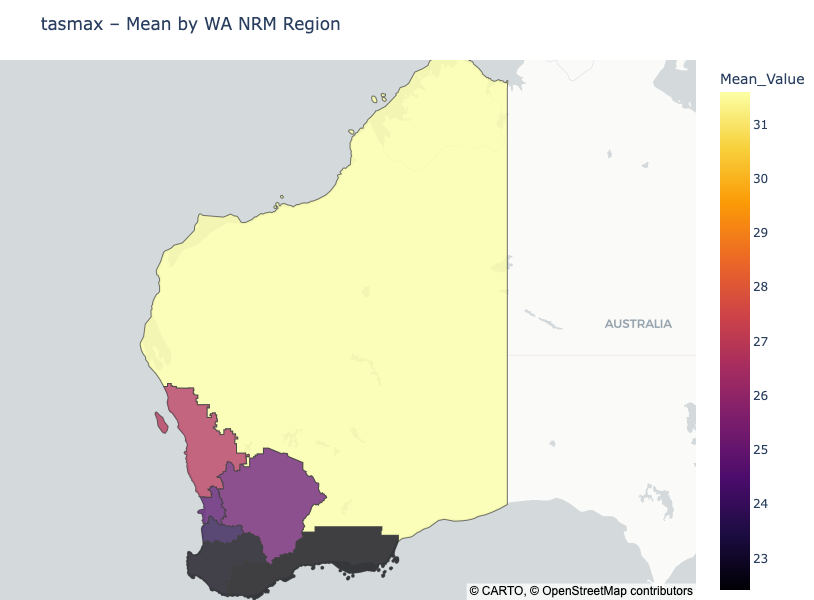

In [10]:
import plotly.express as px
import json

geojson = json.loads(nrm_map.to_json())

fig = px.choropleth_map(
    nrm_map,
    geojson=geojson,
    locations="NRM_REGION",
    featureidkey="properties.NRM_REGION",
    color="Mean_Value",
    hover_name="NRM_REGION",
    hover_data={"Mean_Value": ":.2f"},
    color_continuous_scale="Inferno",
    map_style="carto-positron",  
    zoom=4,
    center={"lat": -25, "lon": 122},
    opacity=0.75
)
fig.update_layout(
    title=f"{variable} – Mean by WA NRM Region",
    height=600,  
    margin={"r":0, "t":60, "l":0, "b":0}
)


fig.show()


<div style="text-align: right">
  <a href="#top">Go back to top</a>
</div>

## Next Steps

**Extend analysis**:
- Multi-year: `xr.open_mfdataset()` multiple files
- More variables: `pr` (precip), `tasmin`
- Statistics: min/max, anomalies, trends
- Export: `summary_df.to_csv("wa_nrm_summary_2019.csv")`

**Stakeholder deliverables**:
- Regional climate summaries
- Heatwave risk assessment
- Planning reports


<div style="text-align: right">
  <a href="#top">Go back to top</a>
</div>